<a href="https://colab.research.google.com/github/ikhwandio4/PCVK_Ganjil_2024/blob/main/week5_pcvk.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Nama: Ikhwandi

kelas : 3F

Nim : 2241720028

Matkul : PCVK

# tugas praktikum


1. Buat Gamma Correction sesuai dengan petunjuk berikut

Percobaan ini akan meminta anda membuat Gamma Correction. Pada percobaan ini, nilai
Gamma akan diset dengan meminta masukan dari pengguna. Berikut adalah kode untuk
meminta masukan nilai dari pengguna. Lanjutkan kode tersebut dengan membuat image
dengan gamma correction sesuai rumus yang telah diberikan.

 Gamma Correction pada citra 
----------------------------------
Masukkan nilai Gamma: 3


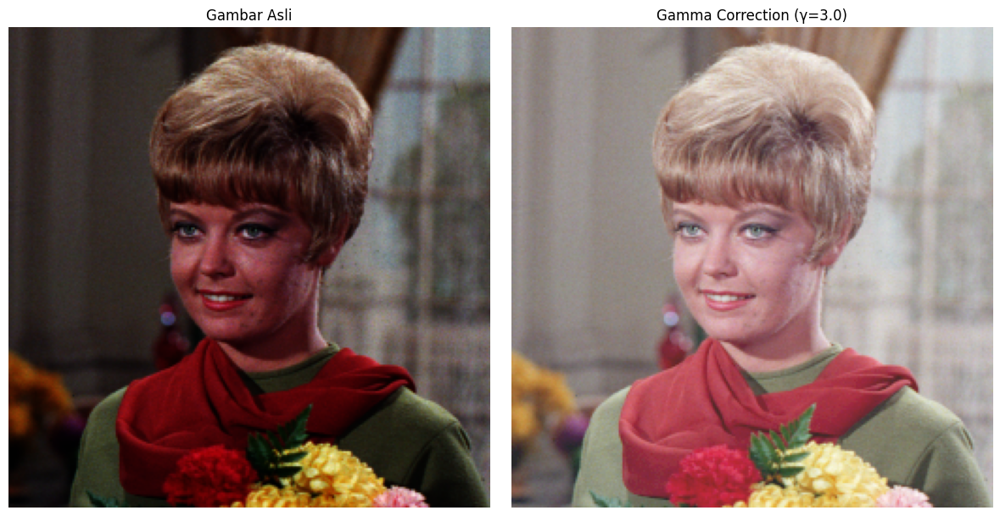

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

print(' Gamma Correction pada citra ')
print('----------------------------------')

try:
    gamma = float(input('Masukkan nilai Gamma: '))
except ValueError:
    print('Error, not a number')
    exit()

def gamma_correction(image, gamma):
    # Aplikasikan koreksi gamma
    image_gamma_corrected = 255 * (image / 255.0) ** (1.0 / gamma)

    # Kembalikan ke range [0, 255] dan konversi ke uint8
    image_gamma_corrected = image_gamma_corrected.astype(np.uint8)

    return image_gamma_corrected

# Baca gambar
image_path = '/content/drive/MyDrive/pcvk/female.tiff'
original_image = cv2.imread(image_path)

if original_image is None:
    print("Error: Gambar tidak dapat dibaca. Pastikan path gambar benar.")
else:
    # Aplikasikan koreksi gamma
    corrected_image = gamma_correction(original_image, gamma)

    # Tampilkan gambar asli dan hasil koreksi gamma
    plt.figure(figsize=(12, 6))

    plt.subplot(121)
    plt.imshow(cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB))
    plt.title('Gambar Asli')
    plt.axis('off')

    plt.subplot(122)
    plt.imshow(cv2.cvtColor(corrected_image, cv2.COLOR_BGR2RGB))
    plt.title(f'Gamma Correction (γ={gamma})')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

2. Buat Simulasi Image Depth

Percobaan ini digunakan sebagai simulasi dari proses kuantisasi citra. Pada kuantisasi citra,
pixel dapat direpresentasikan dengan n-bit kedalaman (default menggunakan 8-bit). Pada
pixel 8-bit, warna yang memungkinkan adalah 256 warna, dari 0 (0000 0000) hingga
255(1111 1111). Pada pixel 7-bit, warna yang memungkinkan adalah 128 warna, dari 0 (000
0000) hingga 127 (111 1111). Kemungkinan warna didapat dari pangkat 2 jumlah bit. Jika
7bit, maka jumlah warnanya adalah 27

= 128, dst.

Masukkan kedalaman bit (1-8): 3


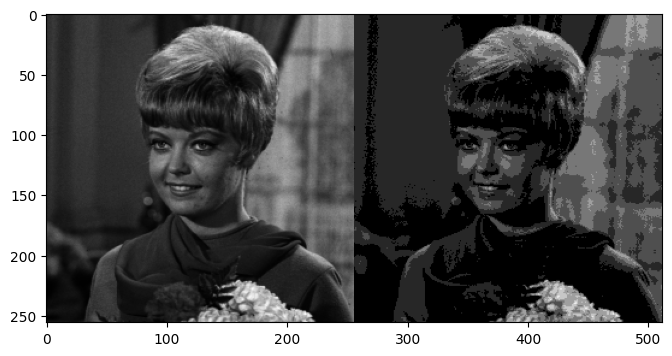

In [6]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

# Membaca citra masukan dalam grayscale
original = cv.imread('/content/drive/MyDrive/pcvk/female.tiff', cv.IMREAD_GRAYSCALE)

if original is None:
    print("Gambar tidak ditemukan. Pastikan path benar.")
    exit()

# Fungsi untuk melakukan kuantisasi citra berdasarkan kedalaman bit
def quantize_image(image, bit_depth):
    level = 255 / (pow(2, bit_depth) - 1)
    quantized_image = (image / level).astype(np.uint8) * level
    return quantized_image

# Input bit-depth dari user
while True:
    try:
        bit_depth = int(input('Masukkan kedalaman bit (1-8): '))
        if bit_depth < 1 or bit_depth > 8:
            print("Error: Kedalaman bit harus antara 1 dan 8.")
            continue
        break
    except ValueError:
        print("Error: Input tidak valid. Silakan coba lagi.")

# Kuantisasi citra berdasarkan bit-depth yang diinput
quantized_image = quantize_image(original, bit_depth)

# Menggabungkan kedua gambar (original dan quantized) secara horizontal
combined_image = np.hstack((original, quantized_image))

# Menampilkan gambar gabungan
plt.figure(figsize=(12, 4))
plt.imshow(combined_image, cmap='gray')

plt.show()

3. Buat modul Average Denoising

Buat modul average denoising sesuai dengan rumus yang telah diberikan pada sub bab
sebelumnya.
Citra asli sudah disediakan pada /images/galaxy.jpg.
100 Citra dengan Gaussian Noise sudah disediakan pada /images/noises/*.jpg
Anda dapat menggunakan code berikut untuk membaca semua image dalam satu folder ,
gunakan modul glob (import glob).

Nilai PSNR dengan 5 citra :  18.170962629648116  dB


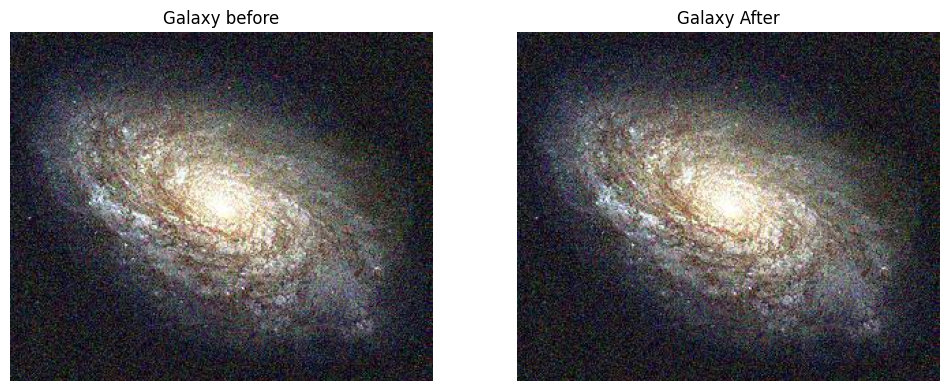

In [12]:
import glob
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from math import sqrt, log10

def PSNR(img1, img2):
  mse = np.mean((img1-img2)**2)
  if(mse==0):
    return 100
  max_pixel = 255.0
  psnr = 20 * log10(max_pixel / sqrt(mse))
  return psnr

# membaca citra asli
original_img = cv.imread('/content/drive/MyDrive/pcvk/galaxy.jpg')

# membaca semua citra yang tersimpan dalam satu folder
cv_img = []
for img in glob.glob('/content/drive/MyDrive/pcvk/noises/*.jpg'):
  n = cv.imread(img)
  cv_img.append(n)

denoised_img = np.zeros(cv_img[0].shape)
jmlGambar = 1
for i in range(jmlGambar):
  denoised_img = denoised_img + cv_img[i]
denoised_img = np.uint16(denoised_img/jmlGambar)

psnr = PSNR(original_img,denoised_img)

print('Nilai PSNR dengan 5 citra : ', psnr, ' dB')
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(cv_img[0], cv.COLOR_BGR2RGB))
plt.title('Galaxy before')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(denoised_img, cv.COLOR_BGR2RGB))
plt.title('Galaxy After')
plt.axis('off')

plt.show()

Nilai PSNR dengan 10 citra :  19.736717518797956  dB


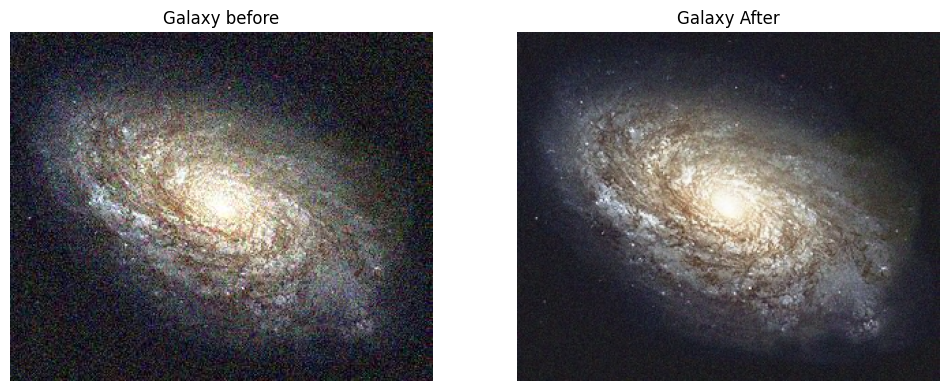

In [10]:
# membaca citra asli
original_img = cv.imread('/content/drive/MyDrive/pcvk/galaxy.jpg')

# membaca semua citra yang tersimpan dalam satu folder
cv_img = []
for img in glob.glob('/content/drive/MyDrive/pcvk/noises/*.jpg'):
  n = cv.imread(img)
  cv_img.append(n)

denoised_img = np.zeros(cv_img[0].shape)
jmlGambar = 10
for i in range(jmlGambar):
  denoised_img = denoised_img + cv_img[i]
denoised_img = np.uint16(denoised_img/jmlGambar)

psnr = PSNR(original_img,denoised_img)

print('Nilai PSNR dengan 10 citra : ', psnr, ' dB')
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(cv_img[0], cv.COLOR_BGR2RGB))
plt.title('Galaxy before')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(denoised_img, cv.COLOR_BGR2RGB))
plt.title('Galaxy After')
plt.axis('off')

plt.show()

Nilai PSNR dengan 20 citra :  19.83846795248077  dB


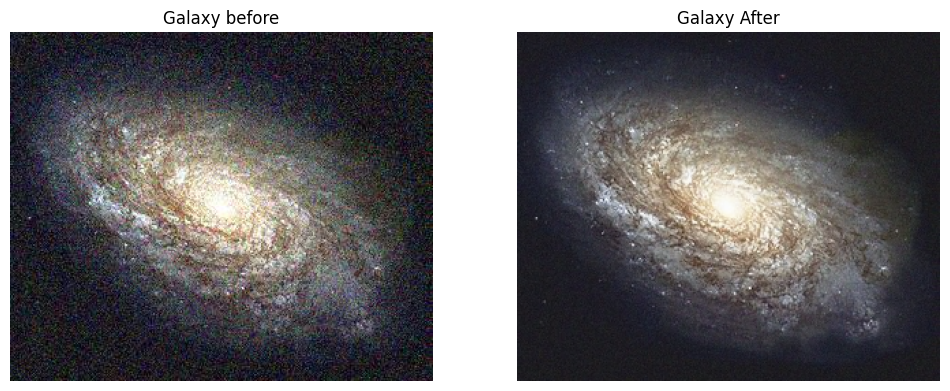

In [13]:
# membaca citra asli
original_img = cv.imread('/content/drive/MyDrive/pcvk/galaxy.jpg')

# membaca semua citra yang tersimpan dalam satu folder
cv_img = []
for img in glob.glob('/content/drive/MyDrive/pcvk/noises/*.jpg'):
  n = cv.imread(img)
  cv_img.append(n)

denoised_img = np.zeros(cv_img[0].shape)
jmlGambar = 20
for i in range(jmlGambar):
  denoised_img = denoised_img + cv_img[i]
denoised_img = np.uint16(denoised_img/jmlGambar)

psnr = PSNR(original_img,denoised_img)

print('Nilai PSNR dengan 20 citra : ', psnr, ' dB')
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(cv_img[0], cv.COLOR_BGR2RGB))
plt.title('Galaxy before')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(denoised_img, cv.COLOR_BGR2RGB))
plt.title('Galaxy After')
plt.axis('off')

plt.show()

Nilai PSNR dengan 40 citra :  19.8921226305477  dB


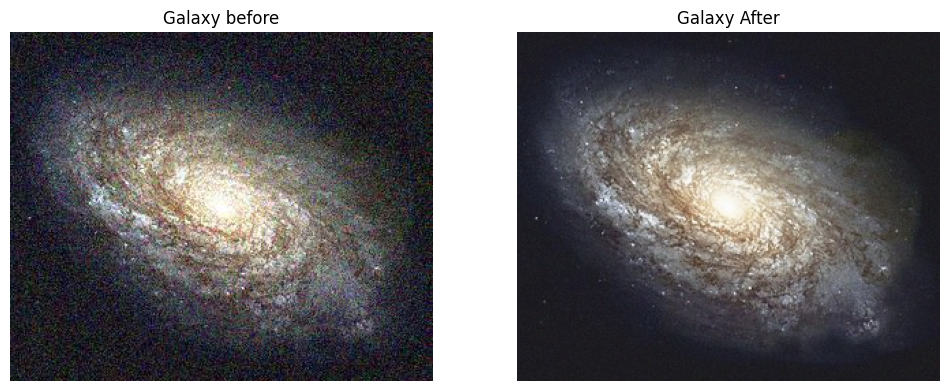

In [14]:
# membaca citra asli
original_img = cv.imread('/content/drive/MyDrive/pcvk/galaxy.jpg')

# membaca semua citra yang tersimpan dalam satu folder
cv_img = []
for img in glob.glob('/content/drive/MyDrive/pcvk/noises/*.jpg'):
  n = cv.imread(img)
  cv_img.append(n)

denoised_img = np.zeros(cv_img[0].shape)
jmlGambar = 40
for i in range(jmlGambar):
  denoised_img = denoised_img + cv_img[i]
denoised_img = np.uint16(denoised_img/jmlGambar)

psnr = PSNR(original_img,denoised_img)

print('Nilai PSNR dengan 40 citra : ', psnr, ' dB')
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(cv_img[0], cv.COLOR_BGR2RGB))
plt.title('Galaxy before')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(denoised_img, cv.COLOR_BGR2RGB))
plt.title('Galaxy After')
plt.axis('off')

plt.show()

Nilai PSNR dengan 80 citra :  19.917087489328924  dB


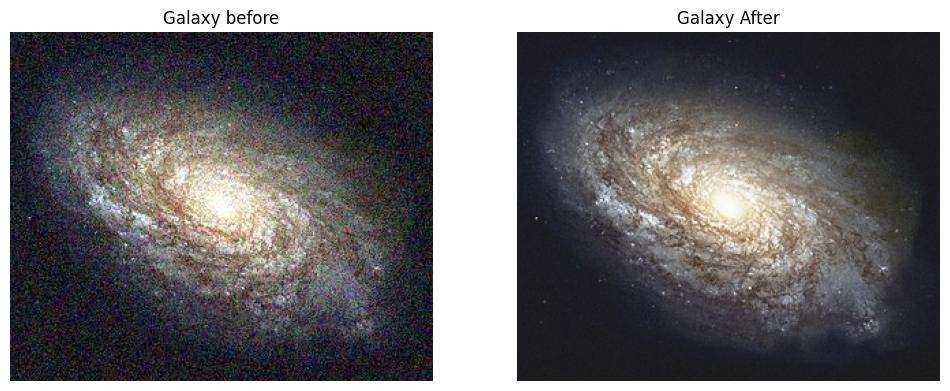

In [15]:
# membaca citra asli
original_img = cv.imread('/content/drive/MyDrive/pcvk/galaxy.jpg')

# membaca semua citra yang tersimpan dalam satu folder
cv_img = []
for img in glob.glob('/content/drive/MyDrive/pcvk/noises/*.jpg'):
  n = cv.imread(img)
  cv_img.append(n)

denoised_img = np.zeros(cv_img[0].shape)
jmlGambar = 80
for i in range(jmlGambar):
  denoised_img = denoised_img + cv_img[i]
denoised_img = np.uint16(denoised_img/jmlGambar)

psnr = PSNR(original_img,denoised_img)

print('Nilai PSNR dengan 80 citra : ', psnr, ' dB')
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(cv_img[0], cv.COLOR_BGR2RGB))
plt.title('Galaxy before')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(denoised_img, cv.COLOR_BGR2RGB))
plt.title('Galaxy After')
plt.axis('off')

plt.show()

Nilai PSNR dengan 100 citra :  19.92196095594035  dB


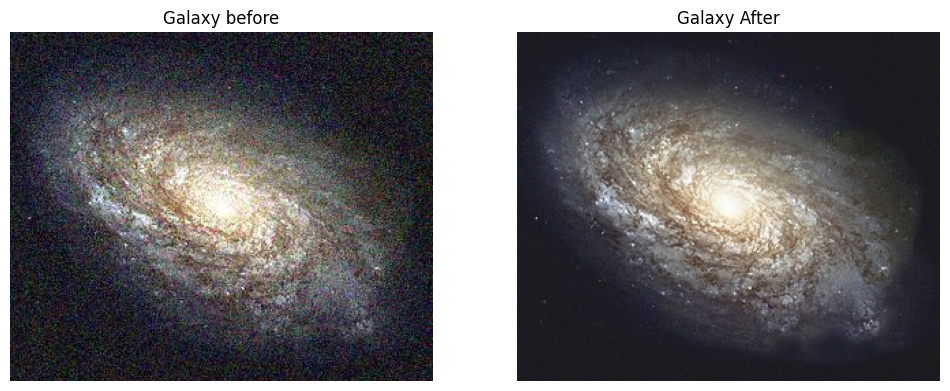

In [16]:
# membaca citra asli
original_img = cv.imread('/content/drive/MyDrive/pcvk/galaxy.jpg')

# membaca semua citra yang tersimpan dalam satu folder
cv_img = []
for img in glob.glob('/content/drive/MyDrive/pcvk/noises/*.jpg'):
  n = cv.imread(img)
  cv_img.append(n)

denoised_img = np.zeros(cv_img[0].shape)
jmlGambar = 100
for i in range(jmlGambar):
  denoised_img = denoised_img + cv_img[i]
denoised_img = np.uint16(denoised_img/jmlGambar)

psnr = PSNR(original_img,denoised_img)

print('Nilai PSNR dengan 100 citra : ', psnr, ' dB')
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(cv_img[0], cv.COLOR_BGR2RGB))
plt.title('Galaxy before')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(denoised_img, cv.COLOR_BGR2RGB))
plt.title('Galaxy After')
plt.axis('off')

plt.show()

kesimpulannya yaitu:

1. Semakin banyak jumlah gambar yang digunakan dalam perhitungan denoised_img, maka nilai hasil PSNR semakin tinggi.
2. Jika nilai hasil PSNR tinggi, maka hasil gambar akan semakin jernih/bagus.
3. PSNR dapat digunakan sebagai metode evaluasi kualitas gambar yang telah di-denoised.
4. Dengan menggunakan PSNR, kita dapat membandingkan kualitas gambar yang dihasilkan oleh berbagai metode denoising yang berbeda.
5. PSNR dapat membantu kita dalam memilih metode denoising yang paling efektif untuk menghasilkan gambar yang jernih dan bagus.

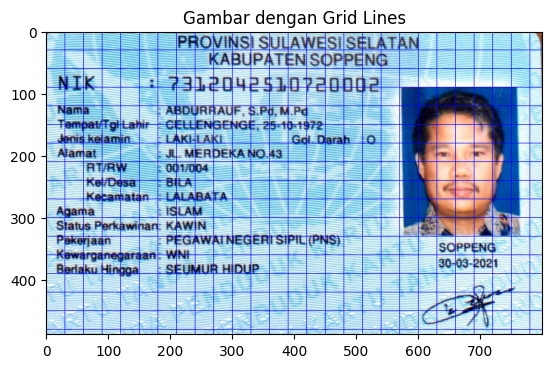

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from skimage import io

# Memuat gambar dengan skimage
img = io.imread('/content/drive/MyDrive/pcvk/KTP.jpeg.jpg')

# Mengonversi gambar ke format BGR untuk penggunaan OpenCV
img_bgr = cv.cvtColor(img, cv.COLOR_RGB2BGR)

# Mendapatkan dimensi gambar
height, width, _ = img_bgr.shape

# Menentukan interval grid
grid_size = 30  # Ukuran grid dalam piksel

# Menambahkan garis vertikal
for x in range(0, width, grid_size):
    cv.line(img_bgr, (x, 0), (x, height), color=(255, 0, 0), thickness=1)

# Menambahkan garis horizontal
for y in range(0, height, grid_size):
    cv.line(img_bgr, (0, y), (width, y), color=(255, 0, 0), thickness=1)

    # Mengonversi gambar kembali dari BGR ke RGB untuk ditampilkan dengan Matplotlib
img_rgb_with_grid = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)

# Menampilkan gambar dengan grid lines
plt.imshow(img_rgb_with_grid)
plt.title("Gambar dengan Grid Lines")
plt.show()



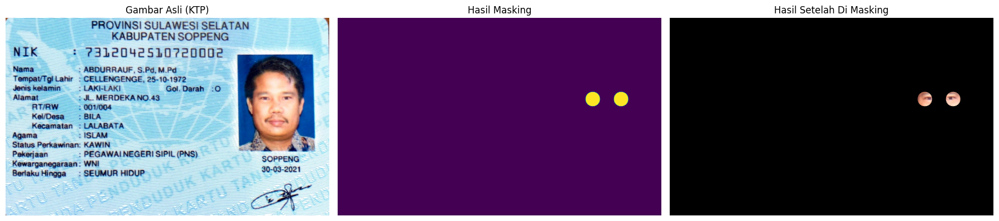

In [25]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from skimage import io

# Memuat gambar asli (KTP) dan mengonversi ke RGB
image = io.imread("/content/drive/MyDrive/pcvk/KTP.jpeg.jpg")
img_bgr = cv.cvtColor(image, cv.COLOR_RGB2BGR)  # Konversi ke BGR untuk OpenCV

# Mendapatkan dimensi gambar
height, width, _ = image.shape

# Membuat gambar kosong (hitam) dengan ukuran yang sama untuk mask
mask_only = np.zeros((height, width), dtype=np.uint8)  # Create a single-channel mask with uint8 data type

# Contoh area mask untuk nama (x, y, radius)
mask_coords = [
    (630, 200, 18),  # Menutupi mata kiri
    (700, 200, 18),  # Menutupi kanan
]

# Terapkan mask pada gambar asli dan gambar mask_only
for (x, y, r) in mask_coords:
    # Masking di mask_only dengan warna putih
    cv.circle(mask_only, (x, y), r, 255, -1)  # Putih untuk menandai area mask

# Menggunakan mask_only sebagai mask untuk meng-extract area yang di-masking dari gambar asli
masked_area = cv.bitwise_and(image, image, mask=mask_only)

# Konversi masked_area ke 3-channel image
masked_area_bgr = cv.cvtColor(masked_area, cv.COLOR_RGB2BGR)

# Menampilkan gambar asli, hasil masking, dan hasil setelah di masking berdampingan
plt.figure(figsize=(18, 6))

# Gambar asli
plt.subplot(131)
plt.imshow(image)
plt.title("Gambar Asli (KTP)")
plt.axis('off')

# Hasil masking
plt.subplot(132)
plt.imshow(mask_only)
plt.title("Hasil Masking")
plt.axis('off')

# Hasil setelah di masking (hanya area yang di-masking)
plt.subplot(133)
plt.imshow(cv.cvtColor(masked_area_bgr, cv.COLOR_BGR2RGB))
plt.title("Hasil Setelah Di Masking")
plt.axis('off')

plt.tight_layout()
plt.show()

5. Lakukan percobaan menggunakan operator lain dan tunjukkan hasilnya pada modul ini. Tuliskan hasil analisa anda kenapa citra keluarannya seperti itu.

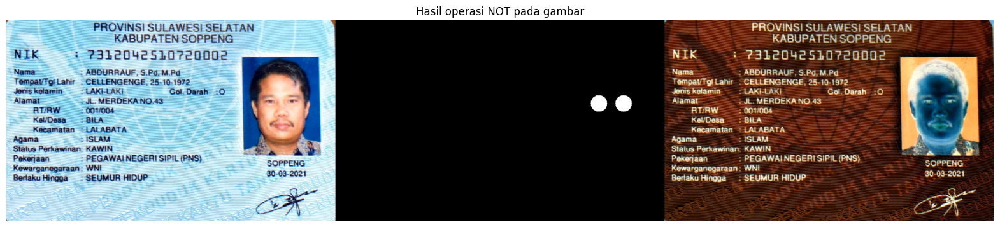

In [38]:
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np

# Baca image
img = cv.imread('/content/drive/MyDrive/pcvk/KTP.jpeg.jpg')
mask = np.zeros(img.shape,dtype=np.uint8)
mask = cv.circle(mask, (640, 203), 20, (255, 255, 255), -1)
mask = cv.circle(mask, (700, 203), 20, (255, 255, 255), -1)

# Lakukan operasi NOT pada gambar
result_not = cv.bitwise_not(img)

# Gabungkan gambar asli, mask, dan hasil operasi NOT
final_frame = cv.hconcat((img, mask, result_not))

# Tampilkan gambar
plt.figure(figsize=(20, 5))
plt.imshow(cv.cvtColor(final_frame, cv.COLOR_BGR2RGB))
plt.title('Hasil operasi NOT pada gambar')
plt.axis('off')
plt.show()

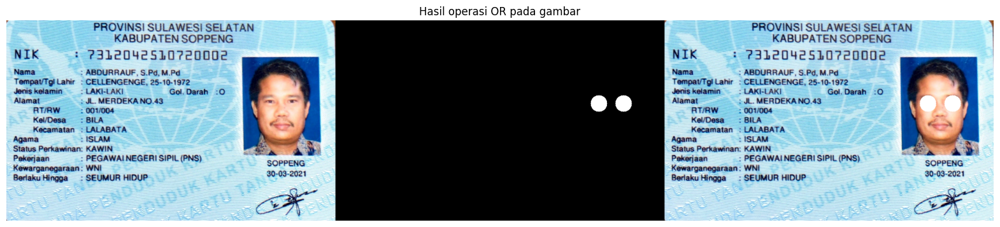

In [39]:

img = cv.imread('/content/drive/MyDrive/pcvk/KTP.jpeg.jpg')
mask = np.zeros(img.shape,dtype=np.uint8)
mask = cv.circle(mask, (640, 203), 20, (255, 255, 255), -1)
mask = cv.circle(mask, (700, 203), 20, (255, 255, 255), -1)

result_or = cv.bitwise_or(img, mask)

final_frame = cv.hconcat((img, mask, result_or))

plt.figure(figsize=(20, 5))
plt.imshow(cv.cvtColor(final_frame, cv.COLOR_BGR2RGB))
plt.title('Hasil operasi OR pada gambar')
plt.axis('off')
plt.show()

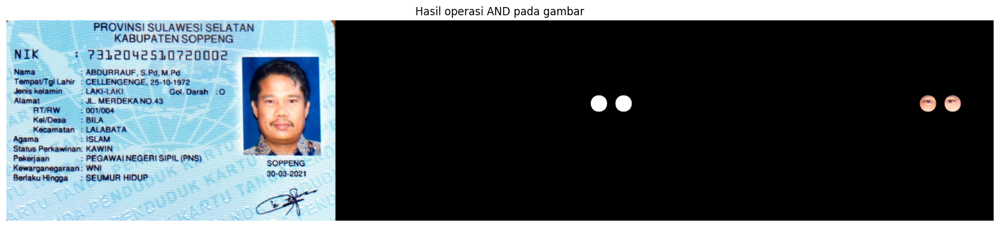

In [40]:

img = cv.imread('/content/drive/MyDrive/pcvk/KTP.jpeg.jpg')
mask = np.zeros(img.shape,dtype=np.uint8)
mask = cv.circle(mask, (640, 203), 20, (255, 255, 255), -1)
mask = cv.circle(mask, (700, 203), 20, (255, 255, 255), -1)

result_and = cv.bitwise_and(img, mask)

final_frame = cv.hconcat((img, mask, result_and))

plt.figure(figsize=(20, 5))
plt.imshow(cv.cvtColor(final_frame, cv.COLOR_BGR2RGB))
plt.title('Hasil operasi AND pada gambar')
plt.axis('off')
plt.show()

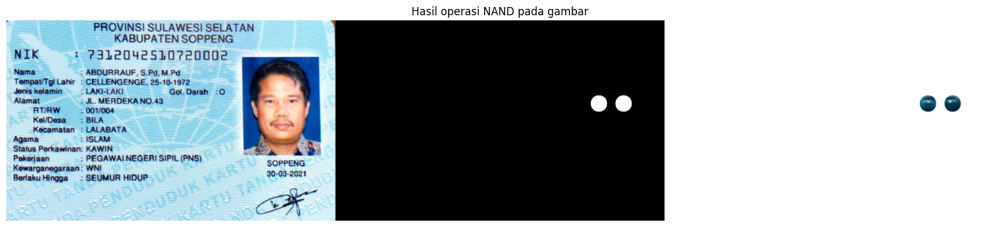

In [41]:

img = cv.imread('/content/drive/MyDrive/pcvk/KTP.jpeg.jpg')
mask = np.zeros(img.shape,dtype=np.uint8)
mask = cv.circle(mask, (640, 203), 20, (255, 255, 255), -1)
mask = cv.circle(mask, (700, 203), 20, (255, 255, 255), -1)

result_nand = cv.bitwise_not(cv.bitwise_and(img, mask))

final_frame = cv.hconcat((img, mask, result_nand))

plt.figure(figsize=(20, 5))
plt.imshow(cv.cvtColor(final_frame, cv.COLOR_BGR2RGB))
plt.title('Hasil operasi NAND pada gambar')
plt.axis('off')
plt.show()

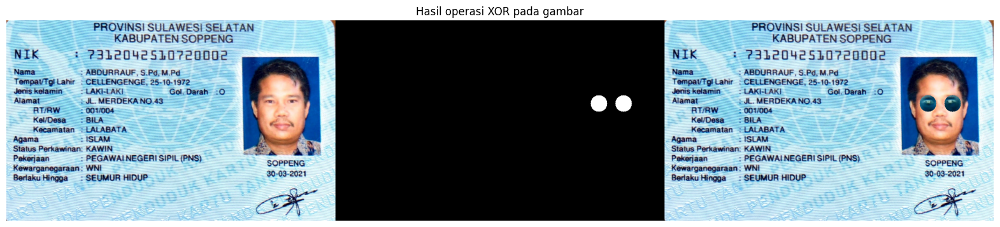

In [42]:

img = cv.imread('/content/drive/MyDrive/pcvk/KTP.jpeg.jpg')
mask = np.zeros(img.shape,dtype=np.uint8)
mask = cv.circle(mask, (640, 203), 20, (255, 255, 255), -1)
mask = cv.circle(mask, (700, 203), 20, (255, 255, 255), -1)

result_xor = cv.bitwise_xor(img, mask)

final_frame = cv.hconcat((img, mask, result_xor))

plt.figure(figsize=(20, 5))
plt.imshow(cv.cvtColor(final_frame, cv.COLOR_BGR2RGB))
plt.title('Hasil operasi XOR pada gambar')
plt.axis('off')
plt.show()

hasil analisa:

1. Operator NOT: Operator NOT digunakan untuk melakukan operasi negasi pada gambar. Hasilnya adalah gambar yang memiliki nilai piksel yang berlawanan dengan gambar asli. Artinya, jika piksel pada gambar asli memiliki nilai 255, maka pada hasil operasi NOT, nilai piksel tersebut menjadi 0.

2. Operator AND: Operator AND digunakan untuk melakukan operasi logika AND pada gambar. Hasilnya adalah gambar yang memiliki nilai piksel yang sama dengan gambar asli hanya jika mask memiliki nilai 255. Jika mask memiliki nilai 0, maka hasil operasi AND akan memiliki nilai 0.

3. Operator OR: Operator OR digunakan untuk melakukan operasi logika OR pada gambar. Hasilnya adalah gambar yang memiliki nilai piksel yang sama dengan gambar asli jika mask memiliki nilai 255 atau 0. Jika mask memiliki nilai 255, maka hasil operasi OR akan memiliki nilai 255.

4. Operator XOR: Operator XOR digunakan untuk melakukan operasi logika XOR pada gambar. Hasilnya adalah gambar yang memiliki nilai piksel yang berlawanan dengan gambar asli jika mask memiliki nilai 255. Jika mask memiliki nilai 0, maka hasil operasi XOR akan memiliki nilai yang sama dengan gambar asli.

5. Operator NAND: Operator NAND digunakan untuk melakukan operasi logika NAND pada gambar. Hasilnya adalah gambar yang memiliki nilai piksel yang berlawanan dengan hasil operasi AND. Artinya, jika hasil operasi AND memiliki nilai 255, maka hasil operasi NAND akan memiliki nilai 0.